# Import EM21S data and plot locations from GPS on a OSM map
#### O. Kaufmann - March 2018 - Passing 2018/03/27

TODO:  
1- filter gps based on fix quality / hdop / aoi  
2- filter EM data based on pitch and roll  

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
import folium
import datetime
import os

## 0- Specify survey parameters

In [2]:
EM_filename = './data/GR01-02_20140606_050749_DEM_COM5.txt'
GPS_filename = './data/GR01-02_20140606_050749_GPS_COM8.txt'
acquisition_date = datetime.datetime.strptime('2018/03/18', '%Y/%m/%d')
output_filename = 'GR01-01.dat'
zoom_start = 14
max_zoom = 20
control_scale = True
if not os.path.exists(EM_filename) and os.path.exists(GPS_filename):
    print('Please check filenames...')

### A function to convert from ddmm angle format to dd format (decimal degree)

In [3]:
def ddmm_to_dd(x):
    degrees = int(x) // 100
    minutes = x - 100 * degrees
    return degrees + minutes/60

## 1- Create a geodataframe from GPS data

In [4]:
df_gps = pd.read_csv(GPS_filename, header=None)
df_gps.columns = ['code', 'timestamp', 'lat', 'NS', 'long', 'EW', 'fix_quality', 'sat.', 'hdop', 'elevation_asl', 'elevation_asl_unit', 'elevation_geoid', 'elevation_geiod_unit', 'x8', 'x9']
df_gps.drop('x8', axis=1, inplace=True)
df_gps.drop('x9', axis=1, inplace=True)

FileNotFoundError: File b'./data/GR01-02_20140606_050749_GPS_COM8.txt' does not exist

### Compute archer date

In [5]:
archer_systime = df_gps[df_gps.code == '$SYSTIME']
archer_date = datetime.datetime.strptime(archer_systime.timestamp.to_string().strip().split()[1].split('.')[0], '%Y%m%d')
archer_date

NameError: name 'df_gps' is not defined

In [6]:
gps_datetime = datetime.datetime.combine(acquisition_date, datetime.datetime.time(datetime.datetime.strptime(str(df_gps[df_gps.index == archer_systime.index[0]+1]['timestamp'].values[0]), '%H%M%S.%f')))

NameError: name 'df_gps' is not defined

### Compute gps positions and set datetime as index

In [7]:
df_gps = df_gps[df_gps.code == '$GPGGA']

NameError: name 'df_gps' is not defined

In [8]:
df_gps['datetime']=df_gps['timestamp'].apply(lambda x: datetime.datetime.combine(acquisition_date, datetime.datetime.time(datetime.datetime.strptime(str(x), '%H%M%S.%f'))))

NameError: name 'df_gps' is not defined

In [9]:
df_gps['long'] = pd.to_numeric(df_gps['long'])
df_gps['lat'] = pd.to_numeric(df_gps['lat'])
df_gps['long'] = df_gps['long'].map(lambda x: ddmm_to_dd(x))
df_gps['lat'] = df_gps['lat'].map(lambda x: ddmm_to_dd(x))
df_gps.set_index('datetime', inplace=True)
df_gps

NameError: name 'df_gps' is not defined

In [10]:
center = [df_gps['lat'].mean(), df_gps['long'].mean()]
center

NameError: name 'df_gps' is not defined

### Create a geodataframe and plot a map of gps points
Warning this may take some time if there are many datapoints, the geodataframe is thus downsampled  
You may skip this section

In [11]:
geo_df_gps = gpd.GeoSeries(df_gps.apply(lambda z: Point(z['long'], z['lat']), 1),crs={'init': 'epsg:4326'})
geo_df_gps = gpd.GeoDataFrame(df_gps, geometry=geo_df_gps) # resample to 1 minute

NameError: name 'df_gps' is not defined

In [12]:
from folium import plugins

map_osm = folium.Map(location=center, zoom_start=zoom_start, max_zoom=max_zoom, control_scale=control_scale)
mc = plugins.FastMarkerCluster([[row.geometry.y, row.geometry.x] for idx, row in geo_df_gps.iterrows()])
mc.add_to(map_osm)
map_osm

NameError: name 'center' is not defined

## 2- Create dataframes from Dual EM measurements

In [13]:
columns = ['code', 'timestamp', 'HCP_cond', 'HCP_iph', 'PRP_cond', 'PRP_iph']

In [14]:
df = pd.read_csv(EM_filename, header = None, names = columns)

### Compute timedelta between gps and archer clocks

In [15]:
archer_systime = df[df.code == '$SYSTIME']
archer_datetime = datetime.datetime.combine(archer_date, datetime.datetime.time(datetime.datetime.strptime(df[df.index == archer_systime.index[0]+1]['timestamp'].values[0], '%H%M%S')))

In [16]:
delta = gps_datetime - archer_datetime
delta

datetime.timedelta(1380, 82727, 200000)

### Update df_EM with datetime as index

In [17]:
df_EM = df.query("code == '$PDLM1' or code == '$PDLM2'")

In [18]:
df_EM['datetime'] = df_EM['timestamp'].apply(lambda x: delta +  datetime.datetime.combine(archer_datetime, datetime.datetime.time(datetime.datetime.strptime(str(x), '%H%M%S'))))
df_EM.set_index('datetime', inplace=True)

/usr/local/lib/python3.5/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [19]:
df_M1 = df_EM[df_EM.code == '$PDLM1']
df_M2 = df_EM[df_EM.code == '$PDLM2']
df_MA = df_EM[df_EM.code == '$PDLMA']
df_M1['timestamp'] = pd.to_numeric(df_M1['timestamp'])
df_M2['timestamp'] = pd.to_numeric(df_M2['timestamp'])
df_M1 = df_M1[df_M1.PRP_iph.str[-3]=='*']
df_M2 = df_M2[df_M2.PRP_iph.str[-3]=='*']
df_M1.PRP_iph = [pd.to_numeric(i[0]) for i in df_M1.PRP_iph.str.split('*')]
df_M2.PRP_iph = [pd.to_numeric(i[0]) for i in df_M2.PRP_iph.str.split('*')]
df_MA.PRP_cond = [pd.to_numeric(i[0]) for i in df_MA.PRP_cond.str.split('*')]
df_MA.columns = ['code', 'batt.', 'temp.', 'pitch', 'roll', 'x']
df_MA.drop('x', axis=1, inplace=True)
df_M1

/usr/local/lib/python3.5/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.
/usr/local/lib/python3.5/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """
/usr/local/lib/python3.5/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if 

,code,timestamp,HCP_cond,HCP_iph,PRP_cond,PRP_iph
datetime,,,,,,
2018-03-18 13:37:36.200,$PDLM1,143849,8.7,0.92,-37.2,2.42
2018-03-18 13:37:36.200,$PDLM1,143849,8.2,0.91,-37.1,2.45
2018-03-18 13:37:36.200,$PDLM1,143849,7.8,0.89,-36.4,2.55
2018-03-18 13:37:37.200,$PDLM1,143850,7.8,0.86,-35.4,2.68
2018-03-18 13:37:37.200,$PDLM1,143850,7.9,0.87,-35.2,2.71
2018-03-18 13:37:37.200,$PDLM1,143850,8.2,0.87,-35.1,2.71
2018-03-18 13:37:37.200,$PDLM1,143850,8.4,0.87,-34.8,2.73
2018-03-18 13:37:37.200,$PDLM1,143850,8.4,0.87,-35.2,2.67
2018-03-18 13:37:38.200,$PDLM1,143851,8.6,0.88,-35.6,2.63


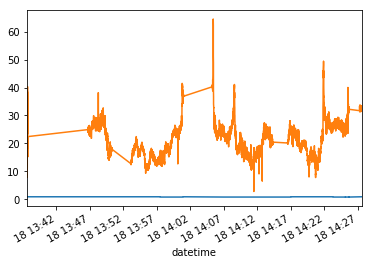

In [20]:
df_gps['hdop'].plot(label='gps hdop')
df_M1['HCP_cond'].plot(label='M1 HCP cond')

## 3- Resample the GPS and EM dataframes  and merge them in a new geodataframe

### Resample gps points to 1 second and create a geodataframe

In [21]:
df_gps_resampled = df_gps.resample('1S').median().interpolate(method='time')

In [22]:
geo_df_gps_resampled = gpd.GeoSeries(df_gps_resampled.apply(lambda z: Point(z['long'], z['lat']), 1),crs={'init': 'epsg:4326'})
geo_df_gps_resampled = gpd.GeoDataFrame(df_gps_resampled, geometry=geo_df_gps_resampled)
geo_df_gps_resampled.dropna(axis=0, how='any', inplace=True) 

### Resample EM measures to 1 second

In [23]:
df_M1_resampled = df_M1.resample('1S').median()
df_M2_resampled = df_M2.resample('1S').median()

### Merge gps and EM

In [24]:
geo_df_EM = geo_df_gps_resampled.join(df_M2_resampled, rsuffix='_M1')
geo_df_EM = geo_df_EM.join(df_M2_resampled, rsuffix='_M2')
geo_df_EM.dropna(axis=0, how='any', inplace=True)
geo_df_EM

,timestamp,lat,long,fix_quality,sat.,hdop,elevation_asl,elevation_geoid,geometry,timestamp_M1,HCP_cond,HCP_iph,PRP_iph,timestamp_M2,HCP_cond_M2,HCP_iph_M2,PRP_iph_M2
datetime,,,,,,,,,,,,,,,,,
2018-03-18 13:37:36,133736.4,50.412794,4.704669,2.0,9.0,0.8,188.5,47.4,POINT (4.704668666666667 50.412794),143849.0,18.70,1.020,3.220,143849.0,18.70,1.020,3.220
2018-03-18 13:37:37,133737.4,50.412795,4.704667,2.0,9.0,0.8,188.3,47.4,POINT (4.704667333333334 50.41279516666667),143850.0,18.70,0.960,3.550,143850.0,18.70,0.960,3.550
2018-03-18 13:37:38,133738.4,50.412798,4.704664,2.0,9.0,0.8,188.1,47.4,POINT (4.7046645 50.4127975),143851.0,18.60,0.990,3.380,143851.0,18.60,0.990,3.380
2018-03-18 13:37:39,133739.4,50.412801,4.704661,2.0,9.0,0.8,187.7,47.4,POINT (4.7046605 50.41280149999999),143852.0,18.50,1.000,3.430,143852.0,18.50,1.000,3.430
2018-03-18 13:37:40,133740.4,50.412804,4.704658,2.0,9.0,0.8,187.4,47.4,POINT (4.704658499999999 50.41280416666667),143853.0,21.20,1.480,-0.270,143853.0,21.20,1.480,-0.270
2018-03-18 13:37:41,133741.4,50.412805,4.704658,2.0,9.0,0.8,187.3,47.4,POINT (4.704657666666666 50.412805),143854.0,24.90,1.760,-5.780,143854.0,24.90,1.760,-5.780
2018-03-18 13:37:42,133742.4,50.412808,4.704652,2.0,9.0,0.8,186.8,47.4,POINT (4.704651666666667 50.4128085),143855.0,26.80,1.890,-8.630,143855.0,26.80,1.890,-8.630
2018-03-18 13:37:43,133743.4,50.412811,4.704648,2.0,9.0,0.8,186.4,47.4,POINT (4.704647999999999 50.412811),143856.0,22.40,1.610,-4.480,143856.0,22.40,1.610,-4.480
2018-03-18 13:37:44,133744.4,50.412811,4.704648,2.0,9.0,0.8,186.4,47.4,POINT (4.704648333333334 50.41281083333333),143857.0,21.30,1.390,-3.170,143857.0,21.30,1.390,-3.170


### Make a map of resampled Dual EM readings (where a reading is available on every sensor)

In [25]:
map_osm = folium.Map(location=center, zoom_start=zoom_start, max_zoom=max_zoom, control_scale=control_scale)
for i, row in geo_df_gps_resampled.iterrows():
    folium.CircleMarker([row.geometry.y, row.geometry.x], popup='(' + str(row['long']) + ', ' + str(row['lat'])+')' , radius=0.75, color='#dd2222', fill_color='#dd2222').add_to(map_osm)
map_osm

## Export data

In [26]:
geo_df_EM.to_csv(output_filename, sep='\t')

## 4- Plot values of a field on a map

In [27]:
import branca

In [28]:
field = 'HCP_cond'
units = '[mS/m]'
df = geo_df_EM[:]
min_val = df[field].min()
max_val = df[field].max()
min_val = 10.
max_val = 30.

In [29]:
cm = branca.colormap.LinearColormap(['red', 'yellow', 'green', 'blue'], vmin=min_val, vmax=max_val, caption=field+' '+units )

In [30]:
f = folium.map.FeatureGroup()
f.layer_name = 'data_points'

for idx, row in df.iterrows():
    f.add_child(
        folium.CircleMarker(location=[row['lat'], row['long']], 
                            popup='hello',
                            radius=1.75,
                            color=cm(row[field]),
                            opacity=0.6)
    )

In [31]:
m = folium.Map(location=center, zoom_start=zoom_start, max_zoom=max_zoom, control_scale=control_scale)
m.add_child(f)
m.add_child(cm) 

## 5- Interpolate data

In [32]:
import naturalneighbor

In [33]:
geo_df_EM['long'] = [row.geometry.x for idx, row in geo_df_EM.iterrows()]
geo_df_EM['lat'] = [row.geometry.y for idx, row in geo_df_EM.iterrows()]
lat_lims = (geo_df_EM['lat'].min(), geo_df_EM['lat'].max())
long_lims = (geo_df_EM['long'].min(), geo_df_EM['long'].max())

In [34]:
geo_df_EM.to_crs(epsg=31370, inplace=True)
geo_df_EM['X'] = [row.geometry.x for idx, row in geo_df_EM.iterrows()]
geo_df_EM['Y'] = [row.geometry.y for idx, row in geo_df_EM.iterrows()]

In [35]:
x_lims = (geo_df_EM['X'].min(), geo_df_EM['X'].max())
y_lims = (geo_df_EM['Y'].min(), geo_df_EM['Y'].max())

In [36]:
points = np.array([(i.x, i.y, 0.) for i in geo_df_EM.geometry.values])
values = np.array([i for i in geo_df_EM[field]])
grid_ranges = [[x_lims[0], x_lims[1], 1.], [y_lims[0], y_lims[1], 1.], [0, 1, 1]]

In [37]:
grid_ranges

[[173751.73513965847, 173979.73231048658, 1.0],
 [122488.20706659928, 123294.20536975563, 1.0],
 [0, 1, 1]]

In [38]:
nn_interpolated_values = naturalneighbor.griddata(points, values, grid_ranges)

In [39]:
data = np.fliplr(nn_interpolated_values.T)

In [40]:
data = data.reshape(np.shape(data)[1:]) # remove unwanted extra dimension

In [41]:
c_data = np.array([cm.rgba_floats_tuple(i) for i in data.flatten()]).reshape((data.shape[0], data.shape[1], 4))

In [42]:
from folium import plugins
interpolation = plugins.ImageOverlay(c_data,
                     bounds=[[lat_lims[0], long_lims[0]], [lat_lims[1], long_lims[1]]],
                     mercator_project=True,
                     opacity=0.7)
interpolation.layer_name = 'interpolated_data'
interpolation.add_to(m)

In [43]:
folium.LayerControl().add_to(m)
m